In [10]:
import os 
import re 
from scipy import ndimage, misc 
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array


from skimage.transform import resize, rescale
import matplotlib.pyplot as plt
import numpy as np
np. random. seed(0)
import cv2 as cv2

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout
from tensorflow.keras.layers import Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
import tensorflow as tf

print(tf.__version__)

2.16.1


In [11]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = r'C:\Users\email\Desktop\Image sr\dataset\Raw Data\high_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '855.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = r'C:\Users\email\Desktop\Image sr\dataset\Raw Data\low_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.jpg':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|███████████████████████████████████████████████████████████████████████████████| 855/855 [00:03<00:00, 264.49it/s]


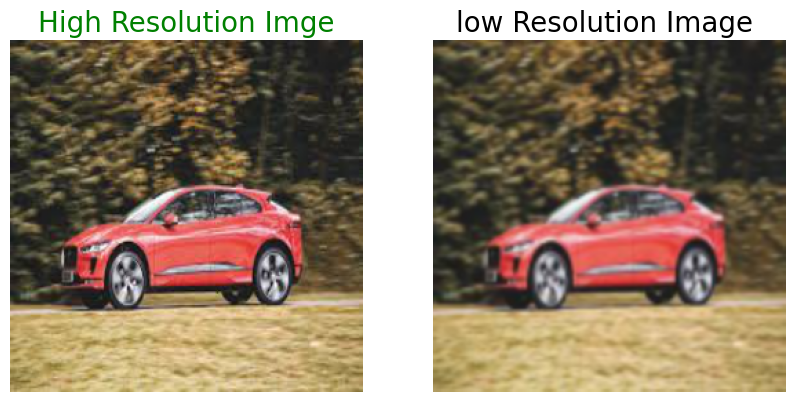

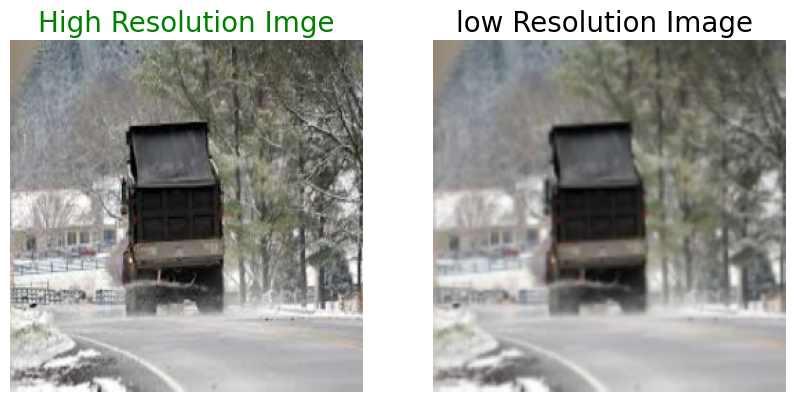

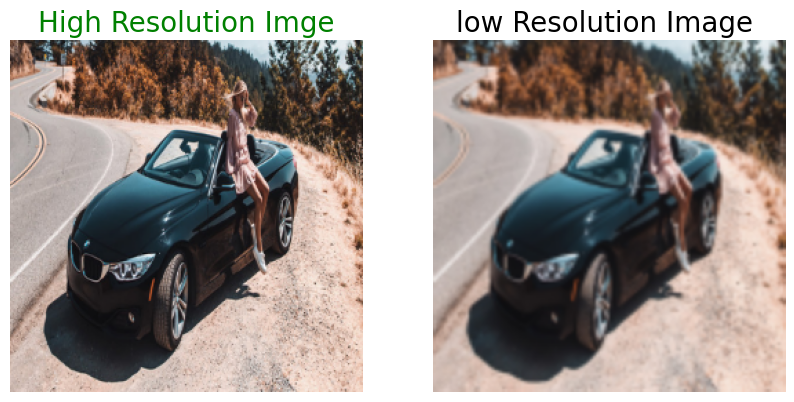

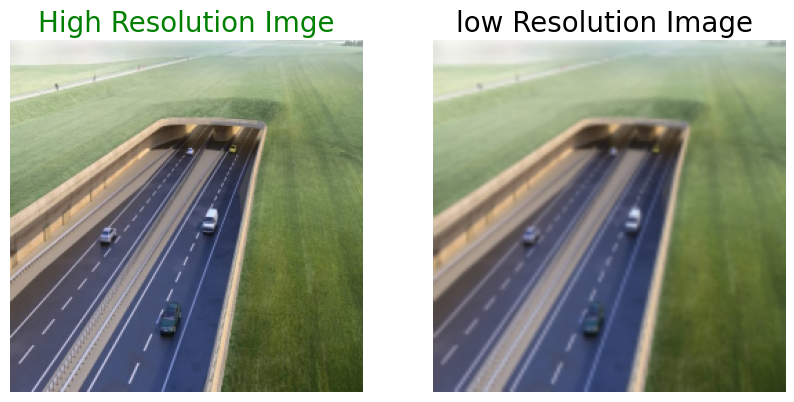

In [12]:
for i in range(4):
    a = np.random.randint(0,855)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')

In [13]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[700:830]
validation_low_image = low_img[700:830]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[830:]
test_low_image = low_img[830:]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

Shape of training images: (700, 256, 256, 3)
Shape of test images: (25, 256, 256, 3)
Shape of validation images: (130, 256, 256, 3)


In [14]:
from keras import layers
from tensorflow.keras.utils import plot_model


#SRCNN=tf.keras.models.Sequential([tf.keras.layers.Conv2D(64,9,padding='same',activation='relu'),
 #      tf.keras.layers.Conv2D(64,1,padding='same',activation='relu'),
 #      tf.keras.layers.Conv2D(3,5,padding='same',activation='relu')])

input_img=Input(shape=(256,256,3))
l1=tf.keras.layers.Conv2D(64,9,padding='same',activation='relu') (input_img)
l2=tf.keras.layers.Conv2D(32,1,padding='same',activation='relu') (l1)
l3=tf.keras.layers.Conv2D(3,5,padding='same',activation='relu') (l2)


SRCNN=Model(input_img,l3)


def pixel_mse_loss(x,y):
    return tf.reduce_mean( (x - y) ** 2 )
SRCNN.compile(optimizer=tf.keras.optimizers.Adam(0.001),loss=pixel_mse_loss)
SRCNN.summary()
plot_model(SRCNN, to_file ='super_res.png',show_shapes=True)

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 256, 256, 64)        │          15,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 256, 256, 32)        │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 256, 256, 3)         │           2,403 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,099 (78.51 KB)

 Trainable params: 20,099 (78.51 KB)

 Non-trainable params: 0 (0.00 B)

You must install pydot (`pip install pydot`) for `plot_model` to work.


In [15]:
SRCNN.fit(train_low_image, train_high_image, epochs = 20, batch_size = 1,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 96s 135ms/step - loss: 0.0217 - val_loss: 0.0025
Epoch 2/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 103s 147ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 3/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 94s 135ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 4/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 94s 135ms/step - loss: 0.0017 - val_loss: 0.0039
Epoch 5/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 94s 134ms/step - loss: 0.0029 - val_loss: 0.0031
Epoch 6/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 95s 136ms/step - loss: 0.0025 - val_loss: 0.0014
Epoch 7/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 94s 134ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 8/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 94s 134ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 9/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 94s 134ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 10/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 94s 134ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 11/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 96s 137ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 12/20
700/70

In [16]:
def PSNR(y_true,y_pred):
    mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
    return 20 * log10(1/ (mse ** 0.5))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def pixel_MSE(y_true,y_pred):
    return tf.reduce_mean( (y_true - y_pred) ** 2 )

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


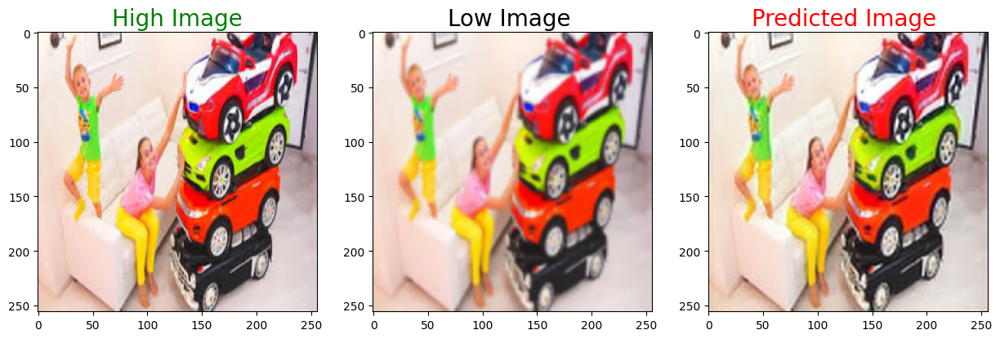

PSNR tf.Tensor(26.198189, shape=(), dtype=float32) dB SSIM tf.Tensor(0.8801363, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


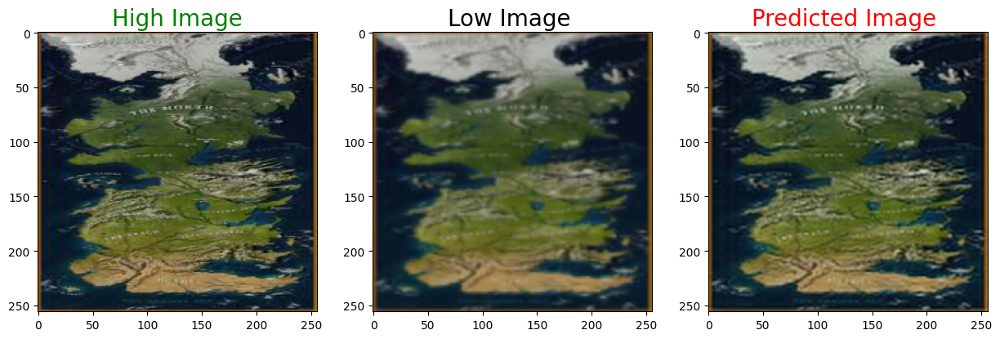

PSNR tf.Tensor(28.126839, shape=(), dtype=float32) dB SSIM tf.Tensor(0.8500364, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


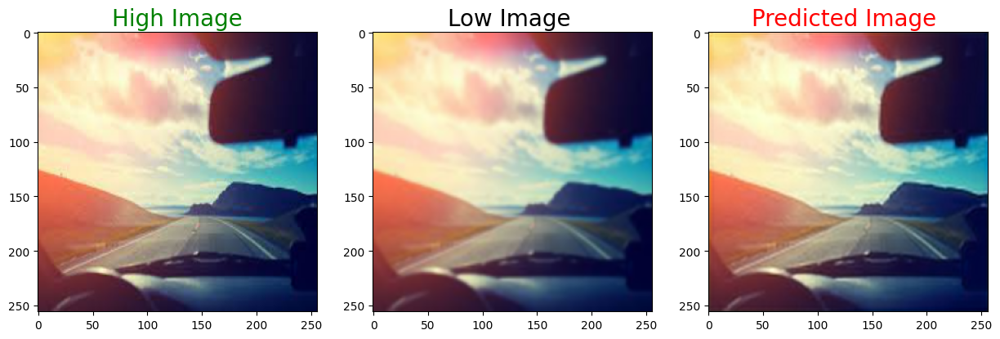

PSNR tf.Tensor(36.018826, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9682761, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


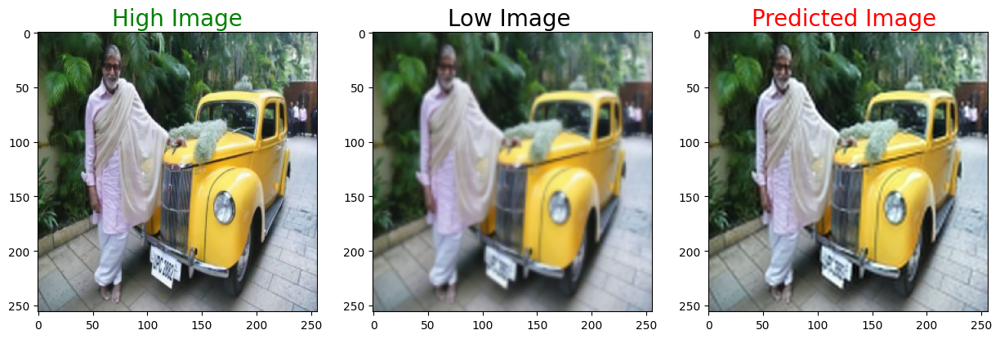

PSNR tf.Tensor(28.621225, shape=(), dtype=float32) dB SSIM tf.Tensor(0.88749504, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


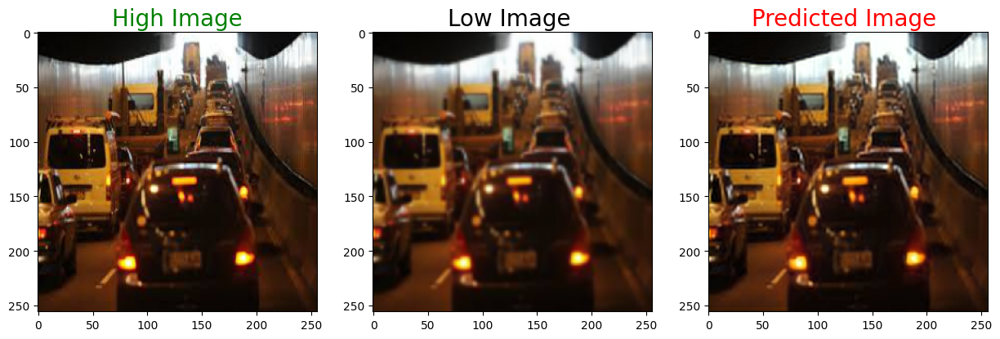

PSNR tf.Tensor(30.816261, shape=(), dtype=float32) dB SSIM tf.Tensor(0.92139935, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


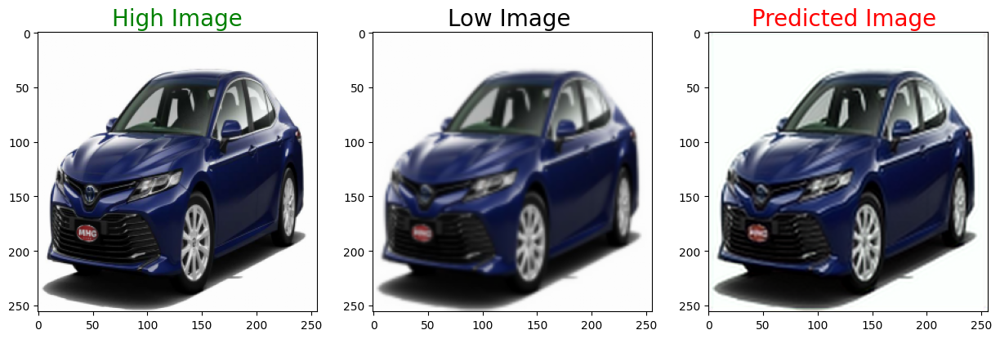

PSNR tf.Tensor(28.697178, shape=(), dtype=float32) dB SSIM tf.Tensor(0.93147045, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


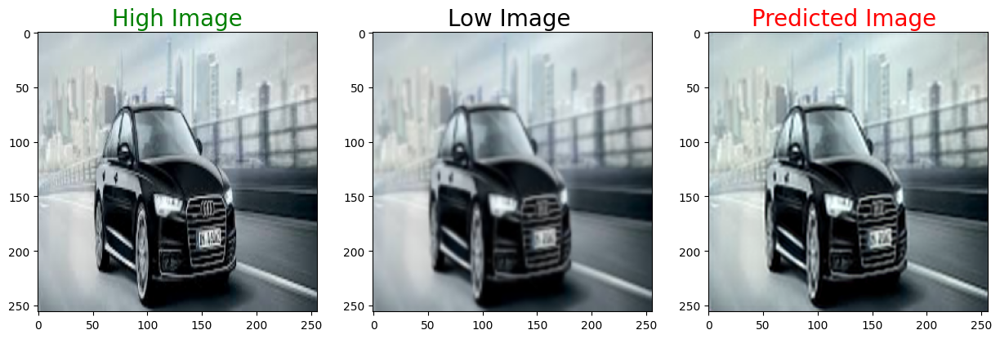

PSNR tf.Tensor(29.234924, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9427281, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


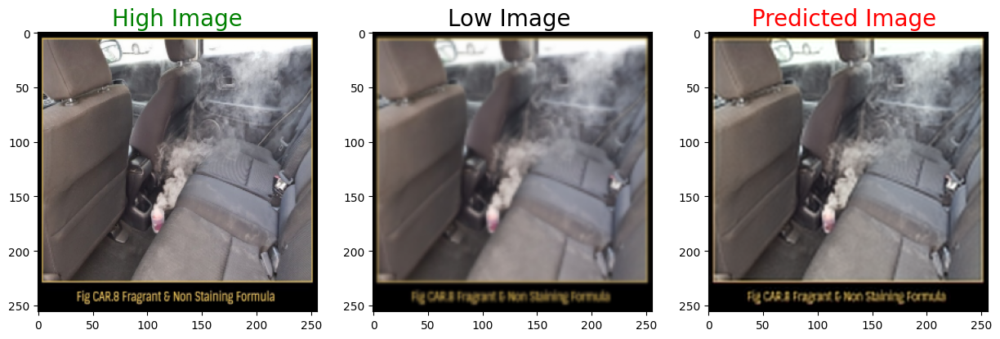

PSNR tf.Tensor(27.252857, shape=(), dtype=float32) dB SSIM tf.Tensor(0.9064197, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


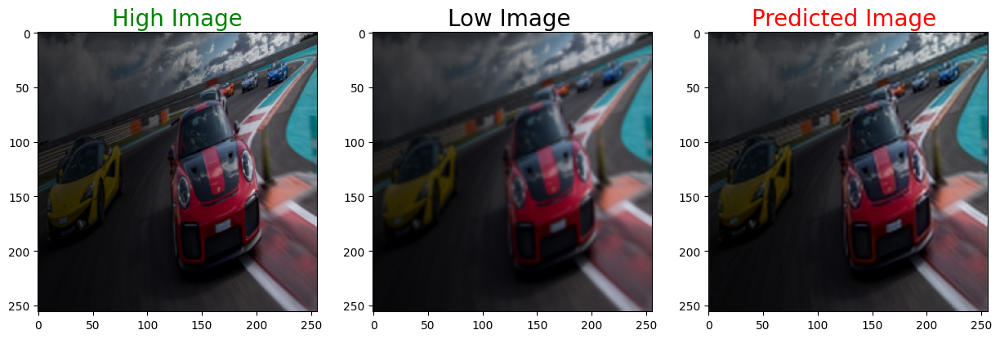

PSNR tf.Tensor(32.5927, shape=(), dtype=float32) dB SSIM tf.Tensor(0.92742413, shape=(), dtype=float32)


In [17]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(16,25):
    
    predicted = np.clip(SRCNN.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR',PSNR(test_high_image[i],predicted),'dB', "SSIM",tf.image.ssim(test_high_image[i],predicted,max_val=1))

In [20]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
#SIZE = 512
high_img = []
path = r'C:\Users\email\Desktop\Image sr\Set5\HR'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '5.png':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = r'C:\Users\email\Desktop\Image sr\Set5\LR\bicubic\x3'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '5.png':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #img = downsample_image(img,4)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        #img = downsample_image(img,2)
        low_img.append(img_to_array(img))
        
sett_high_image = high_img[1:]
sett_low_image = low_img[1:]
sett_high_image= np.reshape(sett_high_image,(len(sett_high_image),SIZE, SIZE,3))
sett_low_image = np.reshape(sett_low_image,(len(sett_low_image),SIZE,SIZE,3))

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 131.22it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


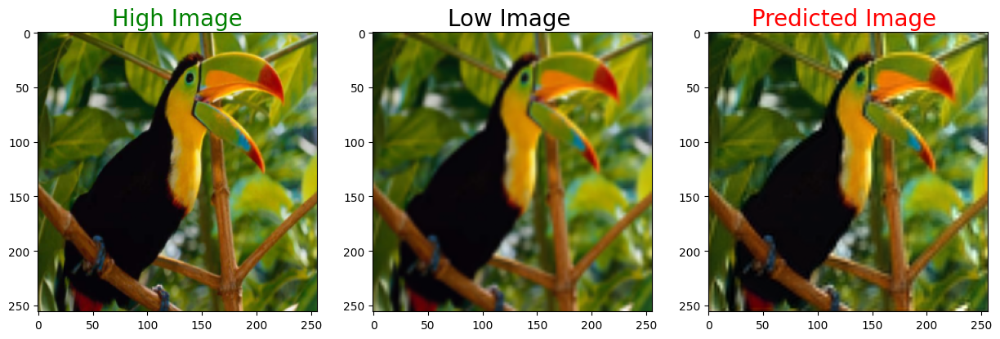

PSNR tf.Tensor(30.141361, shape=(), dtype=float32) dB SSIM tf.Tensor(0.88645655, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


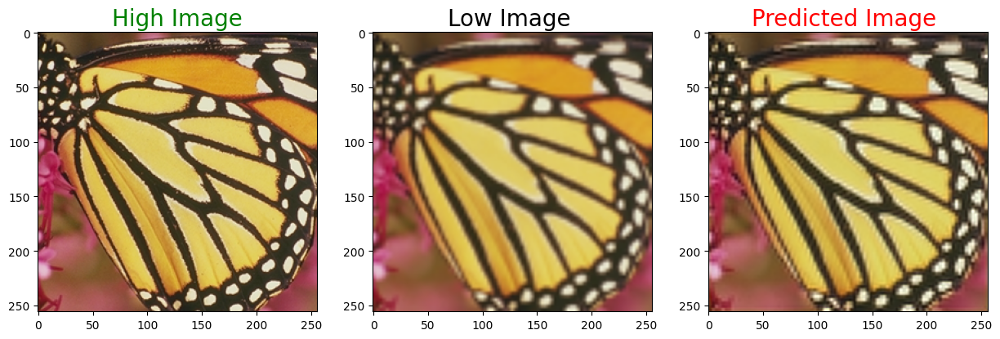

PSNR tf.Tensor(21.234339, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7566457, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


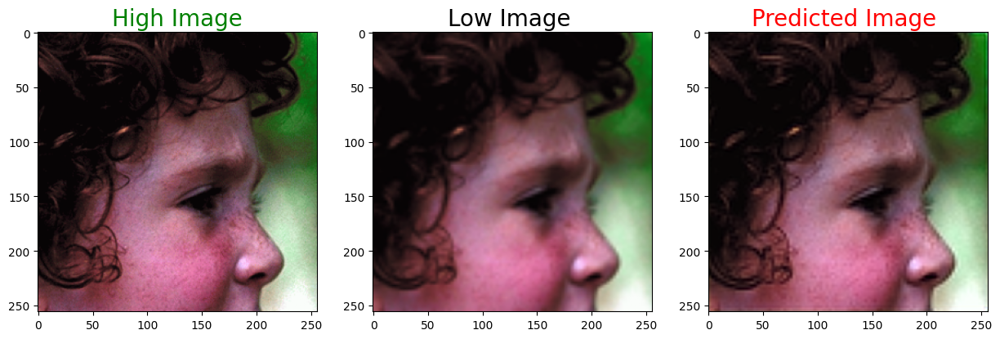

PSNR tf.Tensor(30.644758, shape=(), dtype=float32) dB SSIM tf.Tensor(0.816067, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


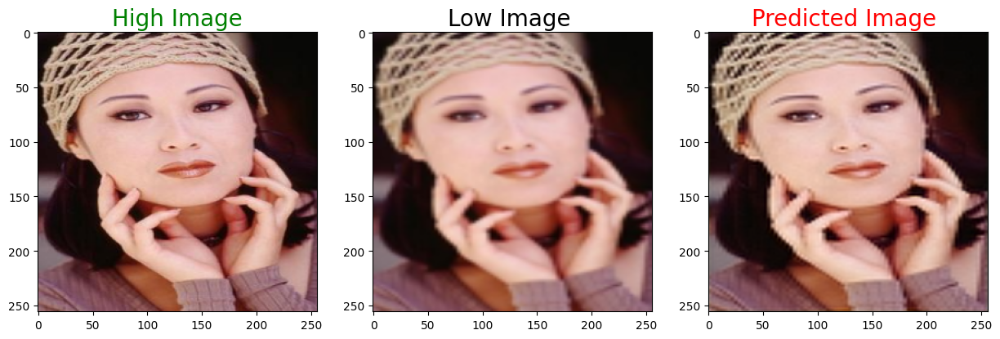

PSNR tf.Tensor(26.403816, shape=(), dtype=float32) dB SSIM tf.Tensor(0.8697954, shape=(), dtype=float32)


In [21]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(0,4):
    
    predicted = np.clip(SRCNN.predict(sett_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(sett_high_image[i],sett_low_image[i],predicted)
    print('PSNR',PSNR(sett_high_image[i],predicted),'dB',"SSIM",tf.image.ssim(sett_high_image[i],predicted,max_val=1))